# 计算机视觉大作业

In [1]:
import numpy
import torch
import numpy as np
import pandas as pd
from sklearn.preprocessing import MultiLabelBinarizer
from collections import Counter
import sklearn
from matplotlib import pyplot as plt
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM
from pytorch_grad_cam.utils.image import show_cam_on_image, deprocess_image, preprocess_image

数据导入和预处理

In [2]:
path = 'plant_dataset\\train\\train_label.csv'
df = pd.read_csv(path)
df.head(20)

,images,labels
0,a8ab965f868fc44c.jpg,healthy
1,a5d8924f7fad18a0.jpg,healthy
2,fab3f2b1c0d2a982.jpg,scab
3,d9b283cd98b19d13.jpg,scab
4,852979c129dde25d.jpg,frog_eye_leaf_spot
5,b76b84406eb75545.jpg,healthy
6,c1a972977e88b49c.jpg,complex
7,ba3457285a4655e7.jpg,scab
8,f2d5d2adc18c6986.jpg,scab
9,e0f996008ddabf0d.jpg,frog_eye_leaf_spot


In [4]:
df.describe()

,images,labels
count,3000,3000
unique,3000,12
top,a8ab965f868fc44c.jpg,scab
freq,1,767


In [5]:
data = np.array(df)
labels = data[:, 1]
mlb = MultiLabelBinarizer() # 多标签编码器
one_hot_encoded = mlb.fit_transform([set(label.split()) for label in labels])
result = np.column_stack((data[:, 0], one_hot_encoded))
I=np.eye(6)
print(I)
print(mlb.inverse_transform(I))
# 输出结果
print(result[:20,:])

[[1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 1.]]
[('complex',), ('frog_eye_leaf_spot',), ('healthy',), ('powdery_mildew',), ('rust',), ('scab',)]
[['a8ab965f868fc44c.jpg' 0 0 1 0 0 0]
 ['a5d8924f7fad18a0.jpg' 0 0 1 0 0 0]
 ['fab3f2b1c0d2a982.jpg' 0 0 0 0 0 1]
 ['d9b283cd98b19d13.jpg' 0 0 0 0 0 1]
 ['852979c129dde25d.jpg' 0 1 0 0 0 0]
 ['b76b84406eb75545.jpg' 0 0 1 0 0 0]
 ['c1a972977e88b49c.jpg' 1 0 0 0 0 0]
 ['ba3457285a4655e7.jpg' 0 0 0 0 0 1]
 ['f2d5d2adc18c6986.jpg' 0 0 0 0 0 1]
 ['e0f996008ddabf0d.jpg' 0 1 0 0 0 0]
 ['bb2ad8e69a846699.jpg' 0 0 1 0 0 0]
 ['c225cf8aba4eb952.jpg' 0 0 1 0 0 0]
 ['bfc86719271047f1.jpg' 0 0 0 0 0 1]
 ['f5b1809b4c867c6e.jpg' 0 0 1 0 0 0]
 ['9f1061a618f3fcc9.jpg' 0 0 0 1 0 0]
 ['dab12ed9c1ce0ce1.jpg' 0 1 0 0 0 0]
 ['9742c28e983ef46b.jpg' 0 1 0 0 0 1]
 ['ca23cf4e3ce73430.jpg' 0 0 0 0 0 1]
 ['aa1620058fbfbcad.jpg' 0 0 0 0 0 1]
 ['c1b7659f9a9214d2.jpg' 0 0 0 0 0 1]]


In [6]:
all_labels = np.unique([ lbl for label in df['labels'].value_counts().keys() for lbl in label.split(' ') ])
all_labels

array(['complex', 'frog_eye_leaf_spot', 'healthy', 'powdery_mildew',
       'rust', 'scab'], dtype='<U18')

In [7]:
label_count = pd.DataFrame(columns=['label', 'count'])
for lbl in all_labels:
    count = df[df['labels'].str.contains(lbl)].count()[0]
    label_count = pd.concat([label_count,pd.DataFrame([{'label': lbl, 'count': count}])], ignore_index=True)
display(label_count)

,label,count
0,complex,355
1,frog_eye_leaf_spot,701
2,healthy,753
3,powdery_mildew,197
4,rust,347
5,scab,897


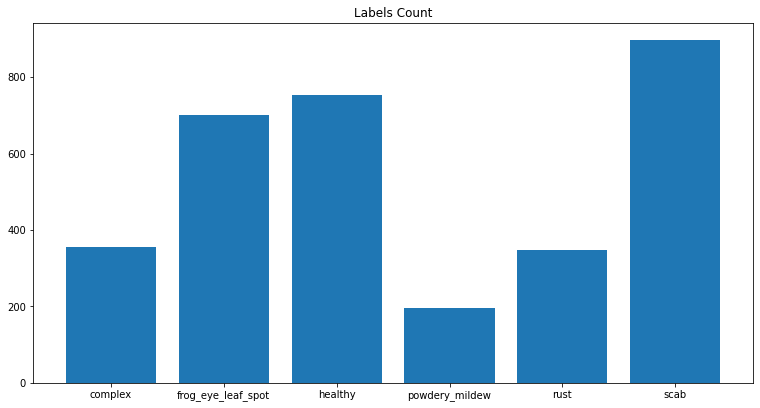

In [8]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_axes([0, 0, 1, 1])
ax.bar(label_count['label'], label_count['count'])
plt.title('Labels Count')
plt.show()

In [9]:
import cv2
import os
def norm(img):
    img = np.array(img)
    img = img.astype(np.float32)
    img -= img.min()
    img /= img.max()
    return img
def show_samples(df, class_name, path):
    plt.figure(figsize=(20, 10))
    labeled_only = df[df.labels==class_name]
    for i in range(min(len(labeled_only), 4)):
        img_name = labeled_only.iloc[i].images
        plt.subplot(3, 4, i + 1)
        plt.title(class_name)
        plt.axis('off')
        img_path = os.path.join(path, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (356, 284), cv2.INTER_AREA)
        plt.imshow(norm(img))
    plt.tight_layout()
    plt.show()

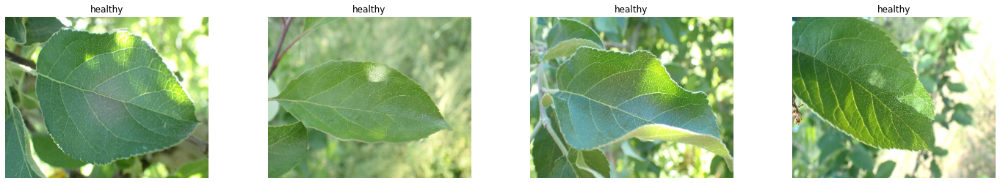

In [10]:
images_folder='plant_dataset/train/images'
show_samples(df, 'healthy', images_folder)

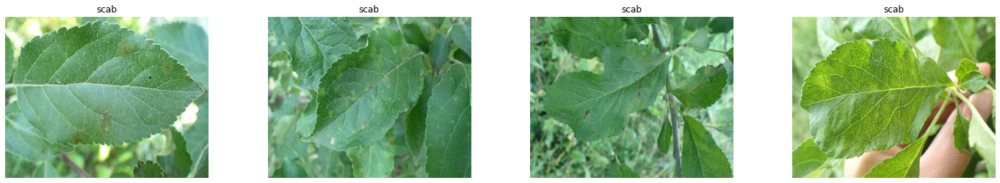

In [11]:
show_samples(df, 'scab', images_folder)

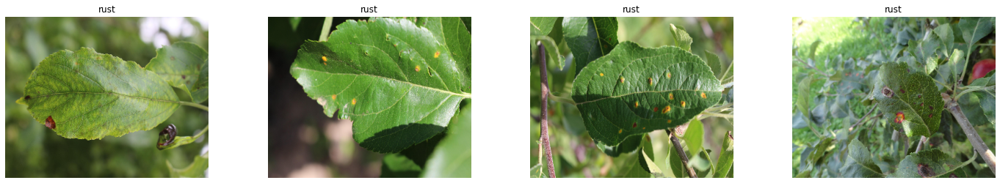

In [12]:
show_samples(df, 'rust', images_folder)

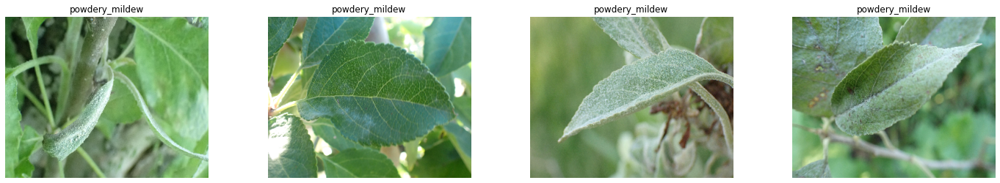

In [13]:
show_samples(df, 'powdery_mildew', images_folder)

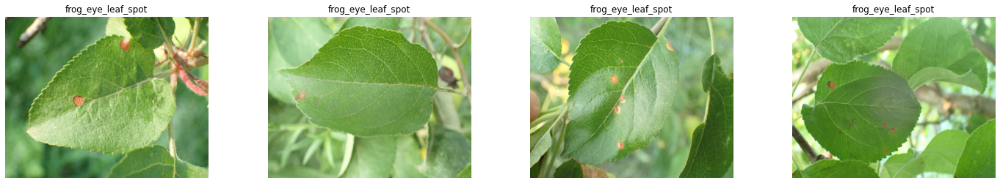

In [14]:
show_samples(df, 'frog_eye_leaf_spot', images_folder)

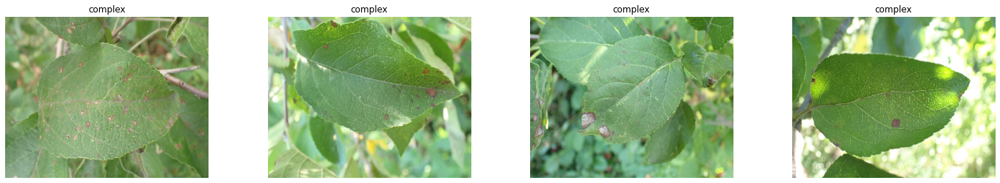

In [15]:
show_samples(df, 'complex', images_folder)

In [11]:
import os
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, models
from PIL import Image
from sklearn.preprocessing import MultiLabelBinarizer
from tqdm import tqdm

In [13]:
# 数据预处理
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

In [14]:
# 自定义数据集类
class CustomDataset(Dataset):
    def __init__(self, root_dir, csv_file, transform=None):
        self.root_dir = root_dir
        self.data = pd.read_csv(csv_file)
        self.transform = transform
        self.mlb = MultiLabelBinarizer()

        # 将多标签转换为one-hot编码
        self.labels_onehot = self.mlb.fit_transform(self.data['labels'].apply(lambda x: x.split()))

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir, self.data.iloc[idx, 0])
        image = Image.open(img_name).convert('RGB')
        label_onehot = torch.tensor(self.labels_onehot[idx])

        if self.transform:
            image = self.transform(image)

        # 返回图像和标签
        return image, label_onehot

# 加载训练数据、验证数据和测试数据
train_dataset = CustomDataset(root_dir='plant_dataset/train/images', csv_file='plant_dataset/train/train_label.csv', transform=transform)
val_dataset = CustomDataset(root_dir='plant_dataset/val/images', csv_file='plant_dataset/val/val_label.csv', transform=transform)
test_dataset = CustomDataset(root_dir='plant_dataset/test/images', csv_file='plant_dataset/test/test_label.csv', transform=transform)

In [15]:
# 定义ResNet模型
class ResNetModel(nn.Module):
    def __init__(self, num_classes):
        super(ResNetModel, self).__init__()
        self.resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        in_features = self.resnet.fc.in_features
        self.resnet.fc = nn.Linear(in_features, num_classes)

    def forward(self, x):
        return self.resnet(x)

# 修改损失函数为适用于多标签分类的损失函数
class MultiLabelCrossEntropyLoss(nn.Module):
    def __init__(self):
        super(MultiLabelCrossEntropyLoss, self).__init__()
        self.loss_fn = nn.BCEWithLogitsLoss()

    def forward(self, outputs, targets):
        return self.loss_fn(outputs, targets)

In [16]:
# 定义数据加载器
batch_size=32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [17]:
# 初始化模型、损失函数和优化器
num_classes = len(train_dataset.mlb.classes_)
print(num_classes)
model = ResNetModel(num_classes)
criterion = MultiLabelCrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

6


In [18]:
num_epochs = 5
train_acc=[0 for _ in range(num_epochs)]
valid_acc=[0 for _ in range(num_epochs)]
test_acc=[0 for _ in range(num_epochs)]
Train_loss=[0 for _ in range(num_epochs)]
Valid_loss=[0 for _ in range(num_epochs)]
Test_loss=[0 for _ in range(num_epochs)]

In [19]:
# 训练模型
for epoch in range(num_epochs):
    model.train()
    for batch_idx, (inputs, labels) in enumerate(tqdm(train_loader, desc=f'Train Epoch {epoch + 1}/{num_epochs}')):
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels.float())
        loss.backward()
        optimizer.step()
    # 在训练集上评估模型
    correct_total = 0
    total_samples = 0
    model.eval()
    train_loss = 0.0
    with torch.no_grad():
        for batch_idx, (inputs, labels) in enumerate(tqdm(train_loader, desc=f'Train Evaluate Epoch {epoch + 1}/{num_epochs}')):
            outputs = model(inputs)
            train_loss += criterion(outputs, labels.float())
            predicted = outputs > 0
            matching_rows = torch.where((predicted == labels).all(dim=1))[0]
            correct_total+=len(matching_rows)
            total_samples += labels.size(0)
    print(f'Train Evaluate {epoch+1}/{num_epochs}, Train Loss: {train_loss/len(train_loader)}')
    accuracy = correct_total / total_samples
    print(f'Train Final Accuracy: {accuracy:.2%},total_samples/correct_total:{correct_total:.0f}/{total_samples:.0f}')
    Train_loss[epoch]=train_loss/len(train_loader)
    train_acc[epoch]=accuracy
    # 在验证集上评估模型
    correct_total = 0
    total_samples = 0
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for batch_idx, (inputs, labels) in enumerate(tqdm(val_loader, desc=f'Epoch {epoch + 1}/{num_epochs}')):
            outputs = model(inputs)
            val_loss += criterion(outputs, labels.float())
            predicted = outputs > 0
            matching_rows = torch.where((predicted == labels).all(dim=1))[0]
            correct_total+=len(matching_rows)
            total_samples += labels.size(0)
    print(f'Val Epoch {epoch+1}/{num_epochs}, Val Loss: {val_loss/len(val_loader)}')
    accuracy = correct_total / total_samples
    print(f'Val Final Accuracy: {accuracy:.2%},total_samples/correct_total:{correct_total:.0f}/{total_samples:.0f}')
    Valid_loss[epoch]=val_loss/len(val_loader)
    valid_acc[epoch]=accuracy
    # 在测试集上进行最终评估
    test_loss = 0.0
    correct_total = 0
    total_samples = 0
    with torch.no_grad():
        for batch_idx, (inputs, labels) in enumerate(tqdm(test_loader, desc=f'Epoch {epoch + 1}/{num_epochs}')):
            outputs = model(inputs)
            loss = criterion(outputs, labels.float())
            test_loss += loss.item()
            predicted = outputs > 0
            matching_rows = torch.where((predicted == labels).all(dim=1))[0]
            correct_total+=len(matching_rows)
            total_samples += labels.size(0)
#             if batch_idx==2:
#                 print(outputs)
#                 print(predicted)
#                 print(labels)
#                 print(matching_rows)
#                 print(correct_total)

    average_test_loss = test_loss / len(test_loader)
    print(f'Final Test Loss: {average_test_loss:.4f}')
    accuracy = correct_total / total_samples
    print(f'Final Accuracy: {accuracy:.2%},total_samples/correct_total:{correct_total:.0f}/{total_samples:.0f}')
    Test_loss[epoch]=test_loss/len(test_loader)
    test_acc[epoch]=accuracy
    model_w='model_param'+str(epoch)+'.pth'
    torch.save(model.state_dict(), model_w)

Train Evaluate Epoch 1/5: 100%|████████████████████████████████████████████████████████| 94/94 [12:45<00:00,  8.15s/it]


Train Evaluate 1/5, Train Loss: 0.22618141770362854
Train Final Accuracy: 66.70%,total_samples/correct_total:2001/3000


Epoch 1/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:34<00:00,  8.15s/it]


Val Epoch 1/5, Val Loss: 0.23127229511737823
Val Final Accuracy: 65.00%,total_samples/correct_total:390/600


Epoch 1/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:34<00:00,  8.11s/it]


Final Test Loss: 0.2281
Final Accuracy: 65.17%,total_samples/correct_total:391/600


Train Evaluate Epoch 2/5: 100%|████████████████████████████████████████████████████████| 94/94 [12:49<00:00,  8.19s/it]


Train Evaluate 2/5, Train Loss: 0.16989390552043915
Train Final Accuracy: 73.57%,total_samples/correct_total:2207/3000


Epoch 2/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:34<00:00,  8.14s/it]


Val Epoch 2/5, Val Loss: 0.17276331782341003
Val Final Accuracy: 74.83%,total_samples/correct_total:449/600


Epoch 2/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:29<00:00,  7.89s/it]


Final Test Loss: 0.1766
Final Accuracy: 73.33%,total_samples/correct_total:440/600


Train Evaluate Epoch 3/5: 100%|████████████████████████████████████████████████████████| 94/94 [12:57<00:00,  8.27s/it]


Train Evaluate 3/5, Train Loss: 0.17106975615024567
Train Final Accuracy: 73.83%,total_samples/correct_total:2215/3000


Epoch 3/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:35<00:00,  8.21s/it]


Val Epoch 3/5, Val Loss: 0.17631860077381134
Val Final Accuracy: 72.33%,total_samples/correct_total:434/600


Epoch 3/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:45<00:00,  8.72s/it]


Final Test Loss: 0.1872
Final Accuracy: 71.00%,total_samples/correct_total:426/600


Train Evaluate Epoch 4/5: 100%|████████████████████████████████████████████████████████| 94/94 [12:13<00:00,  7.81s/it]


Train Evaluate 4/5, Train Loss: 0.13571025431156158
Train Final Accuracy: 79.83%,total_samples/correct_total:2395/3000


Epoch 4/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:27<00:00,  7.75s/it]


Val Epoch 4/5, Val Loss: 0.16139182448387146
Val Final Accuracy: 77.33%,total_samples/correct_total:464/600


Epoch 4/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:40<00:00,  8.43s/it]


Final Test Loss: 0.1766
Final Accuracy: 75.33%,total_samples/correct_total:452/600


Train Evaluate Epoch 5/5: 100%|████████████████████████████████████████████████████████| 94/94 [12:07<00:00,  7.74s/it]


Train Evaluate 5/5, Train Loss: 0.23393099009990692
Train Final Accuracy: 62.17%,total_samples/correct_total:1865/3000


Epoch 5/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:34<00:00,  8.12s/it]


Val Epoch 5/5, Val Loss: 0.24852649867534637
Val Final Accuracy: 60.83%,total_samples/correct_total:365/600


Epoch 5/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:30<00:00,  7.95s/it]


Final Test Loss: 0.2594
Final Accuracy: 57.67%,total_samples/correct_total:346/600


Text(0, 0.5, 'loss')

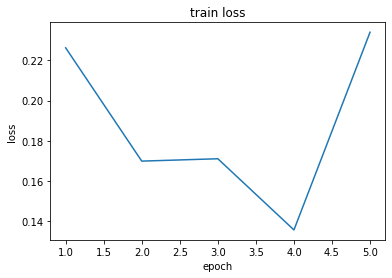

In [95]:
plt.plot(range(1,num_epochs+1),Train_loss)
plt.title('train loss')
plt.xlabel('epoch')
plt.ylabel('loss')

Text(0, 0.5, 'loss')

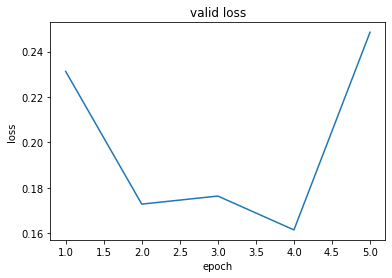

In [96]:
plt.plot(range(1,num_epochs+1),Valid_loss)
plt.title('valid loss')
plt.xlabel('epoch')
plt.ylabel('loss')

Text(0, 0.5, 'loss')

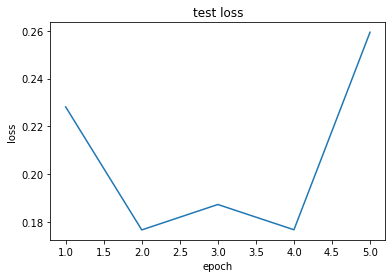

In [97]:
plt.plot(range(1,num_epochs+1),Test_loss)
plt.title('test loss')
plt.xlabel('epoch')
plt.ylabel('loss')

Text(0, 0.5, 'accuracy')

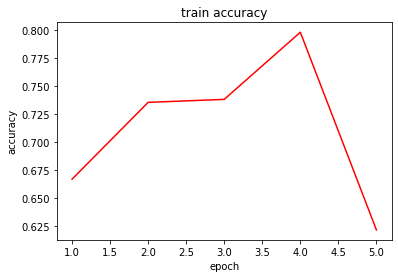

In [98]:
plt.plot(range(1,num_epochs+1),train_acc,color='red')
plt.title('train accuracy')
plt.xlabel('epoch')
plt.ylabel('accuracy')

Text(0, 0.5, 'accuracy')

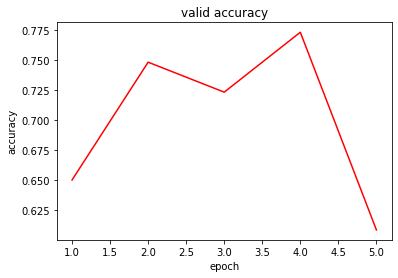

In [99]:
plt.plot(range(1,num_epochs+1),valid_acc,color='red')
plt.title('valid accuracy')
plt.xlabel('epoch')
plt.ylabel('accuracy')

Text(0, 0.5, 'accuracy')

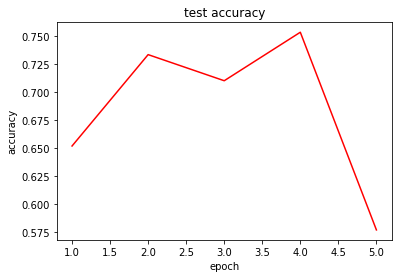

In [101]:
plt.plot(range(1,num_epochs+1),test_acc,color='red')
plt.title('test accuracy')
plt.xlabel('epoch')
plt.ylabel('accuracy')

In [26]:
for name,module in model._modules.items():
        print(name)
print(list(model.children()))

resnet
[ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=

In [51]:
dir(model.resnet)

['T_destination',
 '__annotations__',
 '__call__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_apply',
 '_backward_hooks',
 '_buffers',
 '_call_impl',
 '_forward_hooks',
 '_forward_impl',
 '_forward_pre_hooks',
 '_get_backward_hooks',
 '_get_name',
 '_is_full_backward_hook',
 '_load_from_state_dict',
 '_load_state_dict_post_hooks',
 '_load_state_dict_pre_hooks',
 '_make_layer',
 '_maybe_warn_non_full_backward_hook',
 '_modules',
 '_named_members',
 '_non_persistent_buffers_set',
 '_norm_layer',
 '_parameters',
 '_register_load_state_dict_pre_hook',
 '_register_state_dict_hook',
 '_replicate_for_data_parallel',
 '_save_to_state_dic

In [28]:
# epoch=3是模型最优，加载模型 3
model.load_state_dict(torch.load("model_param3.pth"))

<All keys matched successfully>

In [29]:
# 在测试集上进行最终评估
test_loss = 0.0
correct_total = 0
total_samples = 0
epoch=3
with torch.no_grad():
    for batch_idx, (inputs, labels) in enumerate(tqdm(test_loader, desc=f'Epoch {epoch + 1}/{num_epochs}')):
        outputs = model(inputs)
        loss = criterion(outputs, labels.float())
        test_loss += loss.item()
        predicted = outputs >0
        matching_rows = torch.where((predicted == labels).all(dim=1))[0]
        correct_total+=len(matching_rows)
        total_samples += labels.size(0)
        total_rows=len(labels)
        all_rows = torch.arange(total_rows)
        incorrect_rows = torch.masked_select(all_rows, torch.logical_not(torch.isin(all_rows, matching_rows)))
        incorrect_rows = incorrect_rows.tolist()
        for i in matching_rows:
            print('label:',labels[i],'predicted:',predicted[i],'outputs:',outputs[i])
average_test_loss = test_loss / len(test_loader)
print(f'Final Test Loss: {average_test_loss:.4f}')
accuracy = correct_total / total_samples
print(f'Final Accuracy: {accuracy:.2%},total_samples/correct_total:{correct_total:.0f}/{total_samples:.0f}')

Epoch 4/5:   5%|███▊                                                                    | 1/19 [00:07<02:20,  7.81s/it]

label: tensor([0, 0, 0, 1, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True, False, False]) outputs: tensor([-1.5818, -4.4353, -1.5924,  2.3187, -3.0554, -4.5862])
label: tensor([0, 0, 0, 1, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True, False, False]) outputs: tensor([-3.6962, -4.9297, -2.8861,  3.3243, -3.2896, -5.1879])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-4.6366, -3.8239, -5.8965, -7.9608, -6.5477,  3.7444])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-6.0367, -7.5094, -4.1981, -9.3006, -5.3109,  3.5031])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-7.5475, -9.1321,  4.9680, -7.7423, -5.2519, -7.7047])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: t

Epoch 4/5:  11%|███████▌                                                                | 2/19 [00:16<02:19,  8.19s/it]

label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -6.3834,   7.4484, -13.3765, -13.6764,  -7.1357,  -7.5166])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -5.7825,   7.7563, -15.5343, -15.5400,  -9.1902,  -6.7110])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-5.5579, -3.9501, -6.6229, -7.7340, -8.5058,  4.1309])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-8.3571, -7.3557,  5.0230, -8.6337, -4.6550, -6.5265])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-3.9224, -4.9728, -1.4096, -6.0319, -3.5008,  0.7287])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) 

Epoch 4/5:  16%|███████████▎                                                            | 3/19 [00:23<02:05,  7.83s/it]

label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-10.2779, -10.1106,   6.2667,  -9.1930,  -6.7239,  -8.4308])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-4.9615,  5.0347, -8.6313, -8.7119, -6.9702, -6.7744])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-6.9689, -6.3687,  3.6808, -5.6729, -5.0671, -5.3434])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-6.1274, -6.7788,  3.6392, -6.6317, -4.1254, -4.7648])
label: tensor([0, 0, 0, 1, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True, False, False]) outputs: tensor([-5.0104, -6.6829, -3.0556,  4.9568, -7.4973, -6.7185])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predic

Epoch 4/5:  21%|███████████████▏                                                        | 4/19 [00:31<01:57,  7.85s/it]

label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-8.3021, -8.2989,  4.9713, -8.5223, -6.4053, -5.1255])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-10.1236, -10.3265,   6.7981, -10.6396,  -7.1952,  -8.0202])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-1.8290,  2.7456, -6.9339, -7.6850, -4.1988, -4.0912])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-4.8292, -5.3282, -4.8400, -6.4377, -5.8641,  3.6342])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([-3.1758, -2.4761, -4.7417, -3.3730,  2.5163, -5.6395])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predic

Epoch 4/5:  26%|██████████████████▉                                                     | 5/19 [00:39<01:50,  7.88s/it]

label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-10.4230,  12.6845, -20.8290, -21.7620, -12.4742, -11.2147])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-6.3060, -7.0195, -5.1078, -9.5335, -5.8500,  4.1765])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-3.9961, -4.7592, -5.1951, -6.6350, -6.0903,  3.3462])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([ -6.4212,  -7.2635,  -8.0009, -10.2901,  -8.6746,   6.1275])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-6.2988, -4.8908, -3.5132, -5.0459, -7.3994,  2.6523])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) 

Epoch 4/5:  32%|██████████████████████▋                                                 | 6/19 [00:47<01:44,  8.00s/it]

label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([ -7.8521, -10.3692,  -9.3506, -14.0217,  -8.4971,   7.1411])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-2.4247,  3.3820, -8.0549, -6.4285, -5.6044, -3.8873])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-4.6306, -3.9502,  1.1781, -2.6659, -4.4003, -2.6345])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([-1.1720, -3.3547, -5.5372, -5.0800,  2.9473, -5.5183])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([ -8.9589,  -9.7571, -10.2185, -13.4170, -10.4509,   8.4187])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) 

Epoch 4/5:  37%|██████████████████████████▌                                             | 7/19 [00:56<01:39,  8.27s/it]

label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-2.3676, -2.1347, -6.4908, -6.5862, -4.7289,  1.8999])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-6.8018, -7.5299,  4.2857, -6.5559, -4.3198, -7.0785])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([-2.8190, -3.3023, -5.8126, -5.8823,  3.6891, -5.9922])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([ -8.8530,  -8.9158, -12.6686, -15.1942, -10.9715,   8.8630])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-7.5252, -9.5233,  5.8599, -8.5739, -5.7153, -8.3670])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predic

Epoch 4/5:  42%|██████████████████████████████▎                                         | 8/19 [01:04<01:31,  8.29s/it]

label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -6.2865,   9.5910, -15.6414, -16.6423, -10.7724,  -9.1865])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([ -7.6909,  -7.8090,  -5.3715, -10.2896,  -7.5647,   5.1840])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-4.2027, -4.7653,  1.0104, -0.2153, -3.2859, -4.7770])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([ -6.4310,  -7.3859,  -8.4539, -11.3800,  -7.7206,   5.8979])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-4.7152, -4.0100,  0.8545, -1.8524, -4.0343, -2.8829])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.i

Epoch 4/5:  47%|██████████████████████████████████                                      | 9/19 [01:13<01:23,  8.35s/it]

label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-4.6906, -4.9572, -4.4363, -6.5423, -4.8475,  3.2590])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-6.0206, -5.0592,  0.5709, -4.9360, -5.7571, -0.5080])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-7.1196, -7.3463,  4.3396, -7.2473, -5.8752, -4.5839])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-11.2796, -11.7044,   7.9386, -12.4781,  -7.0589, -10.6640])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-10.6312, -10.8063,  -9.9419, -14.9363, -11.1622,   9.1834])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) 

Epoch 4/5:  53%|█████████████████████████████████████▎                                 | 10/19 [01:21<01:13,  8.18s/it]

label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-6.3796, -6.7456,  4.1414, -7.6815, -4.7698, -4.8266])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([-2.6755, -3.6045, -6.4728, -6.4650,  4.0887, -6.1366])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-5.9350, -4.9399, -2.7309, -6.5097, -4.5767,  2.4325])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -3.4841,   6.0735, -12.6605, -12.5365,  -8.9033,  -5.0545])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-7.0024, -6.6022,  3.8777, -6.7430, -4.0525, -5.9078])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predic

Epoch 4/5:  58%|█████████████████████████████████████████                              | 11/19 [01:29<01:05,  8.15s/it]

label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-6.8749, -7.3400,  4.0801, -6.5852, -4.9039, -5.3860])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-5.3029, -4.6746, -5.5266, -6.8366, -6.4898,  3.7074])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([ -9.3111,  -9.2544,   6.0244, -10.2586,  -5.9612,  -7.7421])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -4.3508,   5.4181, -10.5036,  -9.3218,  -7.4529,  -5.9013])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-11.2248, -10.2116,   7.3058, -11.1743,  -7.8295,  -8.2855])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.i

Epoch 4/5:  63%|████████████████████████████████████████████▊                          | 12/19 [01:36<00:56,  8.03s/it]

label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-5.2032, -4.1413, -2.4619, -3.8974, -6.2886,  1.7559])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-4.5546, -3.3146,  0.3035, -1.0097, -6.0046, -2.6726])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-6.1741, -6.3097, -2.5922, -8.1641, -5.3193,  2.6129])
label: tensor([0, 0, 0, 1, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True, False, False]) outputs: tensor([-2.7267, -3.5557, -2.5473,  2.4419, -3.1774, -3.5306])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -7.7191,   9.5126, -17.1791, -17.2929,  -9.1405,  -9.2151])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predic

Epoch 4/5:  68%|████████████████████████████████████████████████▌                      | 13/19 [01:44<00:47,  7.95s/it]

label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -4.8633,   5.8797, -12.1470, -11.4840,  -7.8895,  -4.1711])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -6.2909,   6.2188,  -9.1957, -13.4042,  -5.3534,  -8.8145])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-4.0191,  2.2097, -4.3572, -3.6984, -5.0621, -4.0441])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-9.8059, -8.6171,  6.3711, -9.4038, -6.3328, -8.2042])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-7.3178, -7.7556, -5.2210, -9.6757, -7.6380,  5.3699])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) 

Epoch 4/5:  74%|████████████████████████████████████████████████████▎                  | 14/19 [01:52<00:39,  7.88s/it]

label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-4.6028, -4.5230,  2.2790, -2.8354, -4.2837, -4.3194])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([-1.5905, -2.6133, -2.1974, -1.6101,  0.5457, -2.9686])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-5.4875, -6.8794, -6.6457, -7.9061, -7.9872,  4.4827])
label: tensor([0, 0, 0, 1, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True, False, False]) outputs: tensor([-3.3814, -5.1934, -3.3474,  3.9908, -5.7033, -4.8347])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-4.7013, -5.9567, -3.2662, -6.0183, -4.8171,  2.7009])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: t

Epoch 4/5:  79%|████████████████████████████████████████████████████████               | 15/19 [02:00<00:31,  7.85s/it]

label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-4.1262, -5.9490, -5.2512, -7.4736, -5.3299,  3.5677])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -6.0126,   7.4804, -16.2731, -15.9125,  -8.1765,  -7.2695])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-6.9055, -6.4535,  3.3707, -7.1799, -4.3474, -4.5831])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-7.0249, -8.2213,  4.2375, -6.4368, -5.6143, -5.1309])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([ -8.4822,  -9.3532,  -8.9746, -12.9902,  -9.0787,   7.6183])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) 

Epoch 4/5:  84%|███████████████████████████████████████████████████████████▊           | 16/19 [02:07<00:23,  7.77s/it]

label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-5.5884, -6.4317, -7.5722, -8.0581, -8.1015,  4.8438])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-3.5956,  5.4694, -9.2829, -8.3521, -6.8452, -6.3374])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-1.4749, -2.3785, -4.6705, -3.9835, -3.4276,  0.5192])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-6.4145, -6.7240,  3.8530, -6.7772, -4.2513, -5.2702])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-5.7449, -5.4321, -0.9738, -7.5366, -5.0225,  1.0429])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: t

Epoch 4/5:  89%|███████████████████████████████████████████████████████████████▌       | 17/19 [02:16<00:15,  7.90s/it]

label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([-3.1321, -3.5086, -3.4074, -7.6654,  2.8972, -6.2882])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-6.8962, -7.2675,  3.2554, -8.1768, -3.6658, -5.0813])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-8.3066, -8.5838,  6.1839, -9.8180, -5.8381, -8.3425])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-4.1017,  4.9949, -8.7527, -9.6368, -7.3454, -5.7218])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-2.9056,  3.5797, -7.3694, -6.9913, -5.8973, -4.2146])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: t

Epoch 4/5:  95%|███████████████████████████████████████████████████████████████████▎   | 18/19 [02:24<00:07,  7.93s/it]

label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -4.4386,   5.7570, -11.0053, -12.1117,  -7.7507,  -5.4584])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-6.5240, -7.5544,  3.1961, -6.4226, -5.5824, -2.9093])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-6.4037, -6.8654, -7.7718, -9.9023, -7.7661,  5.5963])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-1.4091,  1.9622, -8.1050, -5.9333, -4.0194, -3.9729])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-4.9549, -5.2798, -7.4380, -8.8355, -7.0483,  4.8005])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predic

Epoch 4/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:29<00:00,  7.88s/it]

label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([-3.1881, -2.1822, -5.4798, -5.8684,  2.7312, -4.9708])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-8.2939, -9.8472,  6.0359, -9.1961, -5.9345, -8.4934])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-4.6274, -2.6012,  1.9188, -4.9602, -4.0972, -4.1225])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-3.2755,  4.2919, -9.0082, -8.1737, -6.9162, -4.0068])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([ -7.6209,  -8.7787,  -9.0393, -12.6342,  -8.6646,   7.2003])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predic

In [30]:
# 在测试集上进行最终评估
test_loss = 0.0
correct_total = 0
total_samples = 0
epoch=3
print('wrong answer analyse')
with torch.no_grad():
    for batch_idx, (inputs, labels) in enumerate(tqdm(test_loader, desc=f'Epoch {epoch + 1}/{num_epochs}')):
        outputs = model(inputs)
        loss = criterion(outputs, labels.float())
        test_loss += loss.item()
        predicted = outputs >0
        matching_rows = torch.where((predicted == labels).all(dim=1))[0]
        correct_total+=len(matching_rows)
        total_samples += labels.size(0)
        total_rows=len(labels)
        all_rows = torch.arange(total_rows)
        incorrect_rows = torch.masked_select(all_rows, torch.logical_not(torch.isin(all_rows, matching_rows)))
        incorrect_rows = incorrect_rows.tolist()
        for i in incorrect_rows:
            print('label:',labels[i],'predicted:',predicted[i],'outputs:',outputs[i])
average_test_loss = test_loss / len(test_loader)
print(f'Final Test Loss: {average_test_loss:.4f}')
accuracy = correct_total / total_samples
print(f'Final Accuracy: {accuracy:.2%},total_samples/correct_total:{correct_total:.0f}/{total_samples:.0f}')

wrong answer analyse


Epoch 4/5:   5%|███▊                                                                    | 1/19 [00:07<02:23,  7.95s/it]

label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-1.8132,  2.5839, -8.0216, -7.0595, -5.1299, -2.3882])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-4.5653, -5.4908,  1.3536, -1.5620, -5.4514, -2.9899])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False, False]) outputs: tensor([-1.9875, -1.0578, -3.8908, -5.5594, -3.7401, -0.4096])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([ True, False, False, False, False, False]) outputs: tensor([ 1.1099, -0.5243, -5.4920, -3.0122, -3.4533, -1.9322])
label: tensor([0, 1, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-2.1782, -0.2633, -8.1760, -8.0458, -5.9206,  1.0477])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: t

Epoch 4/5:  11%|███████▌                                                                | 2/19 [00:16<02:16,  8.06s/it]

label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-2.8104,  0.3194, -4.2153, -2.7250, -2.1574, -2.5271])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([ True, False, False, False, False, False]) outputs: tensor([ 0.0438, -1.1347, -4.6810, -2.8255, -2.8527, -1.2076])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False, False]) outputs: tensor([-4.3270, -3.6534, -0.4935, -3.8022, -2.5149, -0.3914])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-2.6069,  0.2548, -4.9186, -4.8968, -0.6633, -2.7118])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-1.4622,  0.0933, -2.3610, -5.7423, -4.6395, -4.1577])
label: tensor([0, 1, 0, 0, 0, 1], dtype=torch.int32) predicted: t

Epoch 4/5:  16%|███████████▎                                                            | 3/19 [00:23<02:06,  7.89s/it]

label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-6.9046, -8.2021,  2.3486, -8.4686, -5.3145, -2.1652])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True, False, False]) outputs: tensor([-2.2907, -3.0974, -1.2081,  0.1364, -2.5795, -2.2047])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False, False]) outputs: tensor([-5.1236, -5.9412, -0.5568, -5.6248, -2.8286, -0.5068])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False, False]) outputs: tensor([-1.6073, -2.9350, -4.2622, -1.5015, -0.5495, -1.7487])
label: tensor([1, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([ True, False, False, False, False, False]) outputs: tensor([ 1.1874, -0.7913, -5.7535, -2.6331, -4.1238, -2.1068])


Epoch 4/5:  21%|███████████████▏                                                        | 4/19 [00:31<01:58,  7.89s/it]

label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-4.6300, -4.6069, -4.1432, -5.9317, -4.9844,  2.5742])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False, False]) outputs: tensor([-5.8775, -5.0697, -0.4615, -7.7473, -4.2554, -0.1796])


Epoch 4/5:  26%|██████████████████▉                                                     | 5/19 [00:39<01:48,  7.78s/it]

label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-3.8268, -4.5964, -5.3144, -7.6525, -3.8634,  2.3611])
label: tensor([0, 0, 0, 1, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-3.2533, -1.9610,  0.5101, -5.9716, -4.9245, -5.3220])
label: tensor([1, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-1.7675,  3.4548, -9.0275, -7.8241, -5.3128, -4.4862])
label: tensor([0, 0, 0, 1, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-3.6945, -3.4226,  1.1123, -0.5147, -3.6396, -4.7705])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False, False]) outputs: tensor([-6.5401, -1.4388, -0.3573, -7.6826, -4.7014, -6.6947])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: t

Epoch 4/5:  32%|██████████████████████▋                                                 | 6/19 [00:47<01:41,  7.85s/it]

label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -0.3402,   2.5187, -11.0943,  -9.1880,  -7.1264,  -2.5934])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-8.5545, -8.8060,  3.8891, -9.7306, -5.3467, -3.9881])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -1.0638,   3.5487, -10.6821,  -8.4648,  -5.8566,  -4.5955])
label: tensor([0, 1, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([ True,  True, False, False, False, False]) outputs: tensor([ 0.8175,  0.2733, -7.7498, -4.9571, -4.7354, -2.5719])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-1.1556,  0.8842, -6.8656, -5.4362, -4.3483, -0.5313])
label: tensor([0, 1, 0, 0, 1, 0], dtype=torch.int32) 

Epoch 4/5:  37%|██████████████████████████▌                                             | 7/19 [00:54<01:33,  7.77s/it]

label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-1.8187,  3.1515, -9.5298, -8.4898, -5.8844, -2.4701])
label: tensor([0, 1, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-1.9180,  2.5186, -7.9080, -8.1197, -5.7592, -2.3065])
label: tensor([0, 1, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-0.0187,  0.7047, -5.9793, -5.2359, -5.0265, -3.4929])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False,  True, False, False]) outputs: tensor([-2.6314, -2.9320, -1.7412,  0.3292, -1.9521, -1.2334])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False, False]) outputs: tensor([-3.9151, -0.9654, -4.5976, -6.8200, -4.2486, -0.1957])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: t

Epoch 4/5:  42%|██████████████████████████████▎                                         | 8/19 [01:02<01:25,  7.78s/it]

label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([-1.9372, -3.5650, -2.9053, -3.1231,  0.1861, -1.3179])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False,  True, False, False]) outputs: tensor([-2.3162, -2.4188, -3.3738,  0.6651, -3.5287, -1.9703])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-4.4413, -5.5452,  1.2619, -4.4867, -3.2364, -2.3146])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False, False]) outputs: tensor([-3.7594, -3.0571, -0.0537, -3.1963, -2.3308, -1.3095])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-0.7815,  2.2459, -7.4907, -4.3390, -5.4946, -3.6049])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: t

Epoch 4/5:  47%|██████████████████████████████████                                      | 9/19 [01:10<01:18,  7.84s/it]

label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-4.0051, -2.9705,  1.4284, -4.3070, -3.5872, -5.2770])
label: tensor([0, 1, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([ True,  True, False, False, False, False]) outputs: tensor([ 0.1296,  1.1378, -7.1892, -4.8934, -4.6814, -2.4087])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([ -6.9663,  -4.7828,   0.3866, -11.1183,  -4.6561,  -3.0757])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-2.3111, -5.3732, -3.0820, -3.3586, -4.4316,  1.1066])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False,  True, False, False]) outputs: tensor([-2.1996, -4.4294, -1.9426,  2.3860, -4.3854, -4.0527])
label: tensor([0, 0, 0, 1, 0, 0], dtype=torch.int32) predic

Epoch 4/5:  53%|█████████████████████████████████████▎                                 | 10/19 [01:18<01:10,  7.83s/it]

label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-1.8529,  2.9215, -8.2525, -7.2073, -4.7164, -3.7984])
label: tensor([0, 1, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-1.7092,  1.7374, -7.5268, -6.9612, -3.9078, -2.8547])
label: tensor([0, 1, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-2.1913,  3.1643, -7.6635, -7.4660, -6.2033, -3.0439])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False, False]) outputs: tensor([-1.6750, -1.9630, -2.4794, -0.6762, -3.6428, -3.3956])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False,  True, False, False]) outputs: tensor([-3.0032, -4.3039, -2.6368,  2.9801, -4.4048, -4.3438])
label: tensor([0, 1, 0, 0, 0, 1], dtype=torch.int32) predicted: t

Epoch 4/5:  58%|█████████████████████████████████████████                              | 11/19 [01:26<01:02,  7.85s/it]

label: tensor([0, 1, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([ True,  True, False, False, False, False]) outputs: tensor([ 1.3031,  0.2197, -8.1625, -5.1793, -5.1316, -2.0083])
label: tensor([0, 1, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-1.6667, -1.5089, -8.5816, -6.3978, -5.8925,  1.5748])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-5.5123, -7.4584, -1.9002, -8.7937, -4.4548,  1.0315])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True,  True, False, False]) outputs: tensor([-3.4786, -4.6806,  0.4153,  1.3402, -4.6985, -6.0850])
label: tensor([1, 1, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-0.8485,  2.2490, -8.5869, -6.7785, -4.9014, -3.7855])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: t

Epoch 4/5:  63%|████████████████████████████████████████████▊                          | 12/19 [01:34<00:55,  8.00s/it]

label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-0.8906,  1.1512, -5.4973, -4.8443, -2.8987, -3.4478])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-1.5212,  1.7304, -5.9217, -5.0865, -4.1440, -2.7893])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False,  True, False, False]) outputs: tensor([-2.6970, -4.6872, -2.1809,  3.0357, -4.2676, -4.5660])
label: tensor([0, 1, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-1.0185,  1.3213, -6.6046, -4.4460, -4.0139, -2.3181])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-2.9223, -3.9119, -4.5765, -3.4893, -5.3626,  1.1135])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: t

Epoch 4/5:  68%|████████████████████████████████████████████████▌                      | 13/19 [01:42<00:47,  7.89s/it]

label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False, False]) outputs: tensor([-4.1896, -0.0354, -2.0361, -1.5650, -4.0959, -3.7228])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -5.6555,   3.8920, -12.5220, -11.9560,  -1.6722,  -8.5060])
label: tensor([0, 1, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([ True,  True, False, False, False,  True]) outputs: tensor([ 0.0422,  0.6692, -9.6195, -7.3316, -6.2303,  0.0802])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-6.3111, -6.4468,  0.0155, -7.2548, -4.2651, -0.0558])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False, False]) outputs: tensor([-6.6908, -1.2360, -0.9016, -8.0024, -5.3651, -6.2147])
label: tensor([1, 1, 0, 0, 0, 1], dtype=torch.int32) predic

Epoch 4/5:  74%|████████████████████████████████████████████████████▎                  | 14/19 [01:50<00:39,  7.87s/it]

label: tensor([0, 1, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([ True,  True, False, False, False, False]) outputs: tensor([  0.2315,   1.2904, -10.0224,  -7.5194,  -6.4747,  -0.9568])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-5.4424, -2.1397,  1.0137, -4.9928, -4.1559, -3.1857])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-1.5232, -1.0760, -5.7848, -4.7513, -5.4800,  0.7005])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-0.2532, -2.0414, -6.5325, -4.7954, -4.3440,  0.1330])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -2.2498,   4.7994, -12.2918, -10.1297,  -7.0025,  -4.5674])
label: tensor([0, 1, 0, 0, 0, 1], dtype=torch.int32) 

Epoch 4/5:  79%|████████████████████████████████████████████████████████               | 15/19 [01:57<00:31,  7.83s/it]

label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False, False]) outputs: tensor([-1.5618, -1.8054, -2.6930, -0.1039, -5.4683, -2.2376])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -1.4713,   3.8830, -10.4865,  -9.4561,  -7.2096,  -3.1329])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -1.7761,   3.4459, -11.6150,  -9.7357,  -7.7077,  -1.4024])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False, False]) outputs: tensor([-1.8898, -0.8172, -3.2207, -3.5243, -1.7554, -3.0226])
label: tensor([0, 0, 0, 1, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True,  True, False, False]) outputs: tensor([-2.9712, -4.1559,  0.4066,  0.3080, -3.6697, -4.1585])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) 

Epoch 4/5:  84%|███████████████████████████████████████████████████████████▊           | 16/19 [02:05<00:23,  7.75s/it]

label: tensor([1, 1, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-1.1970,  2.0595, -8.1518, -7.6481, -5.0772, -2.8292])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([ True,  True, False, False, False, False]) outputs: tensor([ 0.2773,  0.0420, -4.8256, -2.7112, -3.3749, -2.0308])
label: tensor([0, 1, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([-2.5048, -3.8622, -5.1811, -4.1964,  3.2723, -5.4596])
label: tensor([0, 1, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([ -5.2932,  -4.1785, -10.1136, -10.7949,  -6.9483,   4.7390])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False, False]) outputs: tensor([-3.5033, -1.4948, -5.1355, -6.1373, -2.4085, -0.1555])
label: tensor([1, 0, 0, 0, 1, 0], dtype=torch.int32) predic

Epoch 4/5:  89%|███████████████████████████████████████████████████████████████▌       | 17/19 [02:13<00:15,  7.88s/it]

label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -1.1577,   3.1982, -10.4619,  -7.9508,  -5.8771,  -4.9123])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False, False]) outputs: tensor([-4.7189, -5.1061, -0.2303, -3.9864, -4.1208, -0.0756])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False, False]) outputs: tensor([-1.0907, -0.4508, -4.7864, -5.5774, -3.2538, -0.8834])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([ True,  True, False, False, False, False]) outputs: tensor([ 0.5532,  0.3369, -6.3888, -4.1593, -3.6301, -2.3813])


Epoch 4/5:  95%|███████████████████████████████████████████████████████████████████▎   | 18/19 [02:21<00:07,  7.95s/it]

label: tensor([0, 1, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -3.4051,   5.3489, -10.9671, -10.3099,  -6.9699,  -5.1879])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False, False]) outputs: tensor([-2.6441, -1.9790, -1.6189, -2.6092, -1.1306, -0.7162])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -3.6945,   6.4266, -14.3882, -13.0927,  -9.0872,  -4.1143])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-0.6895,  0.2371, -3.8856, -2.2961, -4.8874, -4.9476])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-7.4520, -8.6184, -0.2073, -9.8480, -5.6303,  0.9305])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) 

Epoch 4/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:27<00:00,  7.76s/it]

label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-7.6760, -7.9227,  5.0955, -7.2132, -5.3953, -6.8921])
label: tensor([0, 0, 0, 1, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-2.8877, -5.4401,  1.1780, -0.0852, -4.3981, -4.4024])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False,  True, False, False]) outputs: tensor([-3.1933, -3.4844, -3.4662,  2.9181, -4.6419, -3.6647])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False,  True, False, False]) outputs: tensor([-1.9444, -3.6933, -1.6249,  0.6980, -2.9341, -1.3170])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-0.5107,  2.2373, -8.4241, -5.8905, -5.4945, -2.9744])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: t

In [59]:
test_path = 'plant_dataset/test/test_label.csv'
df_test = pd.read_csv(test_path)

In [60]:
target_layer = [model.resnet.layer4[-1]]
cam = GradCAM(model=model, target_layers=target_layer, use_cuda=False)
test_path='plant_dataset/test/images'
test_fea_path='plant_dataset/test/fea_images'

In [61]:
def show_feature(df, class_name, path,fea_path,cam):
    plt.figure(figsize=(20, 10))
    labeled_only = df[df.labels==class_name]
    if(len(labeled_only)==0):
        return
    df_sample=labeled_only.sample(n=1)
    img_name = df_sample.iloc[0].images
    plt.subplot(1, 2, 1)
    plt.title(class_name)
    plt.axis('off')
    img_path = os.path.join(path, img_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (356, 284), cv2.INTER_AREA)
    plt.imshow(norm(img))
    # feature map
    img = Image.open(img_path).convert('RGB')
    img = img.resize((224,224))
    img = np.array(img)
    img_float_np = np.float32(img)/255
    transform=transforms.Compose([
        transforms.ToTensor(),
    ])
    input_tensor = transform(img)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    input_tensor = input_tensor.to(device)
    input_tensor = input_tensor.unsqueeze(0)
    targets = None 
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets,eigen_smooth=True) 
    grayscale_cam = grayscale_cam[0,:]
    cam_image = show_cam_on_image(img_float_np, grayscale_cam, use_rgb=True)
    img_fea_path=os.path.join(fea_path, img_name)
    cv2.imwrite(img_fea_path, cam_image)
    plt.subplot(1, 2, 2)
    plt.title(class_name)
    plt.axis('off')
    img = cv2.imread(img_fea_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (356, 284), cv2.INTER_AREA)
    plt.imshow(norm(img))
    plt.tight_layout()
    plt.show()

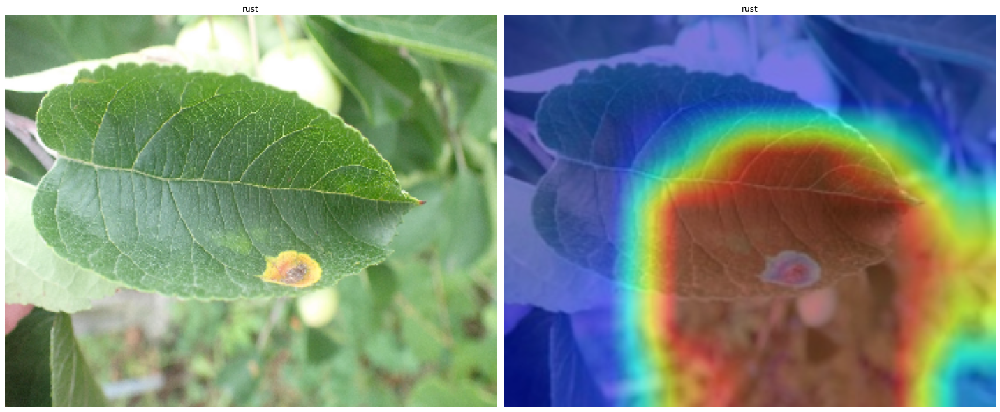

In [75]:
show_feature(df_test,'rust', test_path,test_fea_path,cam)

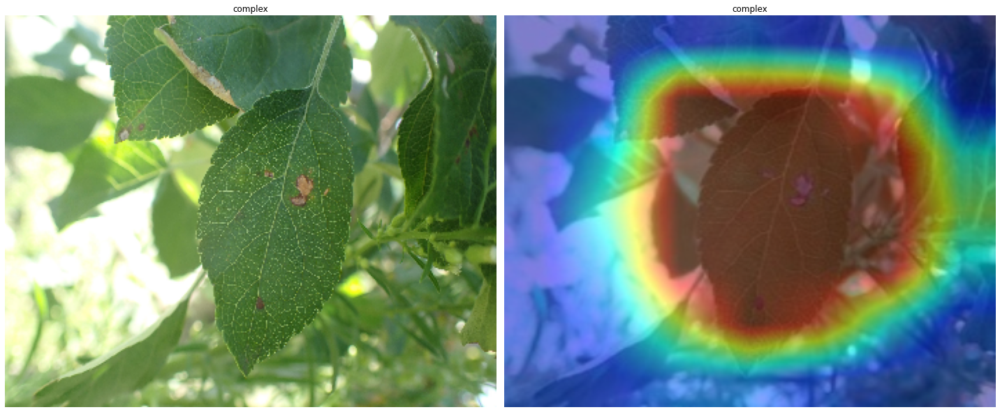

In [94]:
show_feature(df_test,'complex', test_path,test_fea_path,cam)

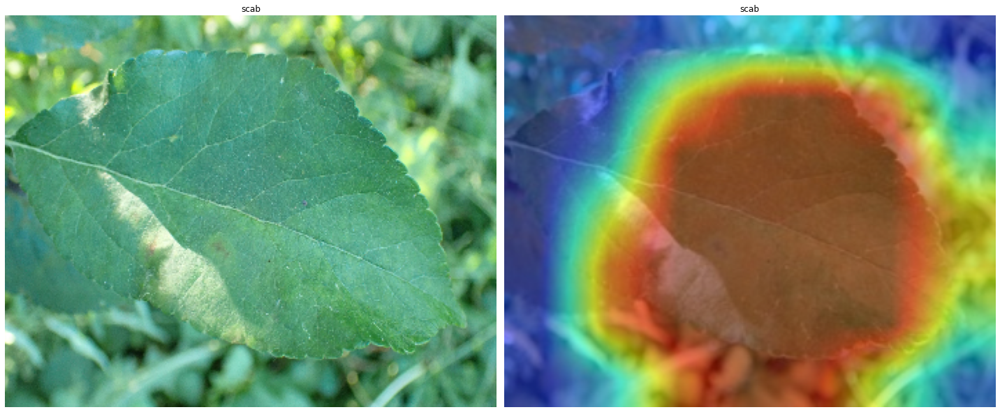

In [82]:
show_feature(df_test,'scab', test_path,test_fea_path,cam)

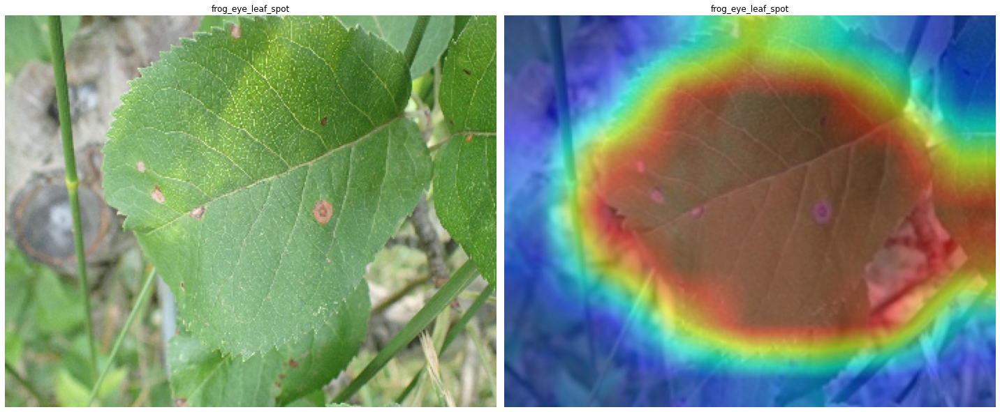

In [84]:
show_feature(df_test,'frog_eye_leaf_spot', test_path,test_fea_path,cam)

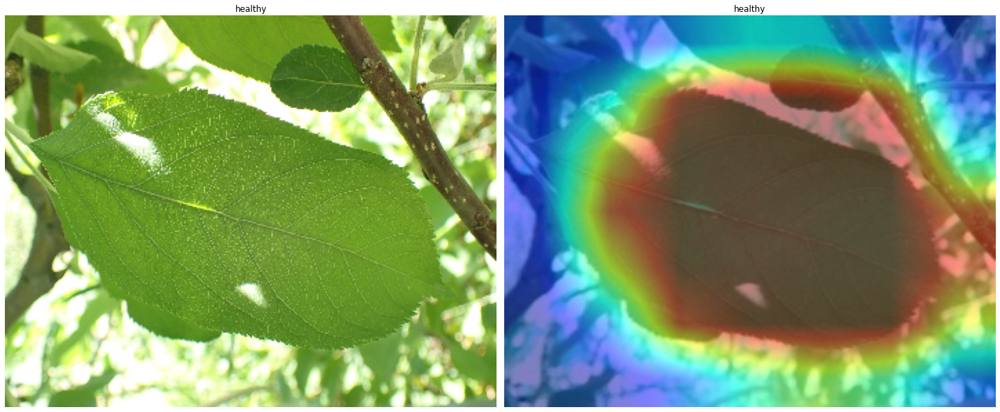

In [90]:
show_feature(df_test,'healthy', test_path,test_fea_path,cam)

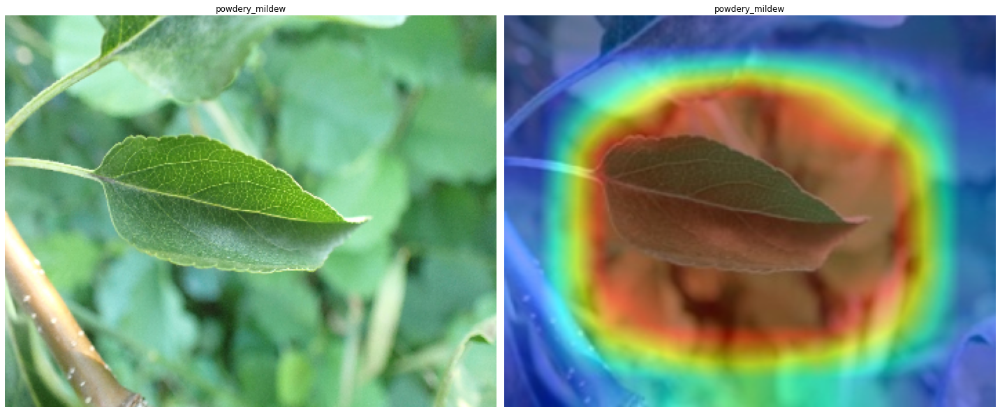

In [88]:
show_feature(df_test,'powdery_mildew', test_path,test_fea_path,cam)

In [96]:
import numpy as np
from collections import Counter
data = np.array(df_test)
Counter(data[:,1])

Counter({'powdery_mildew': 34,
         'complex': 52,
         'scab': 160,
         'healthy': 145,
         'frog_eye_leaf_spot': 105,
         'rust': 65,
         'scab frog_eye_leaf_spot': 26,
         'frog_eye_leaf_spot complex': 5,
         'rust complex': 2,
         'rust frog_eye_leaf_spot': 2,
         'scab frog_eye_leaf_spot complex': 4})

In [21]:
total_rows=32
all_rows = torch.arange(total_rows)
matching_rows=torch.tensor([1,2,30])
print(all_rows)
incorrect_rows = torch.masked_select(all_rows, torch.logical_not(torch.isin(all_rows, matching_rows)))
print("Incorrectly predicted rows:", incorrect_rows.tolist())
batch_acc=1-len(incorrect_rows.tolist())/total_rows
print(f'batch accuracy:{batch_acc:.2%}')

tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31])
Incorrectly predicted rows: [0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31]
batch accuracy:9.38%
